# Latin BERT on LatinISE for Christian-related semantic change

WARNING: this code may take a few hours to run. `rebuild` needs to be set to `True` to output files containing embeddings for the first time. Results can be loaded from the pickle files for subsequent runs, with `rebuild` set to `False`.

The structure is as follows:
- Set up metadata dataframe
- Build corpus and subcorpora
- Use pre-trained Latin BERT to produce LatinISE embeddings
    - Average embeddings per word type and calculate cosine similarity across subcorpora
    - Try different techniques for clustering embeddings as to maintain sense distinction
    - Plot some results for illustrative purposes
- Fine-tune BERT on LatinISE
    - Repeat averaging, clustering, and plotting

Uses Latin BERT (Bamman and Burns, 2020): https://github.com/dbamman/latin-bert/tree/master.

## Packages

In [1]:
import os 
import csv
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from gen_berts import LatinBERT, LatinTokenizer, BertLatin # in gen_berts.py
from nltk.corpus.reader.plaintext import PlaintextCorpusReader
from nltk.tokenize.simple import SpaceTokenizer, LineTokenizer
from nltk.text import Text
from collections import defaultdict, Counter
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cosine
from scipy.spatial.distance import jensenshannon

/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/transformers/utils/generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/transformers/utils/generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


Embeddings etc. will be calculated if `rebuild` is `True`, and loaded from the previous run if `rebuild` is `False`:

In [2]:
rebuild = False

## Read the files (corpus and metadata)

Decide if you want to work with lemmatized or unlemmatized text (we suggest lemmatized):

In [3]:
lemmas_or_tokens = "lemmas" # this can be "lemmas" or "tokens" 
# because the corpus is small, using lemmas rather than tokens helps eliminate variation and achieve better results

Find folder with corpus in directory:

In [4]:
dir_in = os.path.join("/Users", "valentinalunardi", "Documents", "UCLA_PhD", "Thesis", "Metadata_corrections")

Define path to output folder:

In [5]:
dir_out = os.path.join(dir_in, "bert_tests", "output")

Define files and count them (the lemmas and tokens are grouped by text, so the number reflects the number of texts):

In [6]:
files = os.listdir(os.path.join(dir_in, "preprocessed_"+lemmas_or_tokens+"_2024"))
len(files)

1247

Use IntraText and Musisque Deoque texts in LatinISE (there are just a few texts in the corpus extracted from LacusCurtius, but these are not included yetdue to potential clashes):

In [7]:
files = [f for f in files[:] if ("IT" in f or "MQDQ" in f)]
len(files)

1233

Read the metadata file:

In [8]:
metadata_df = pd.read_csv(os.path.join(dir_in, 'latinise_metadata_2024.csv'), sep = ",")
metadata_df = metadata_df[metadata_df['id'].str.startswith(("IT", "MQDQ"))]
metadata_df

,id,title,creator,date,type,file
0,IT-LAT0261,Carmen Saliare,[Auctor incertus],-650,poetry,lat_0350_IT-LAT0261.txt
1,IT-LAT0285,XII Tabularum Leges,[Auctor incertus],-450,prose,lat_-0450_IT-LAT0285.txt
2,IT-LAT0262,Carmen Arvale,[Auctor incertus],-350,poetry,lat_0350_IT-LAT0262.txt
3,MQDQ-288,carminum fragmenta,"Caecus, Appius Claudius",-290,poetry,lat_-0300_MQDQ-288.txt
4,IT-LAT1006,Praecepta,"Marcius Vates, Gnaeus",-229,prose,lat_-0229_IT-LAT1006.txt
...,...,...,...,...,...,...
1242,IT-LAT0446,Sacramentorum sanctitatis tutela,Ioannes Paulus PP. II,2002,prose,lat_2002_IT-LAT0446.txt
1243,IT-LAT0536,Misericordia Dei,Ioannes Paulus PP. II,2002,prose,lat_2002_IT-LAT0536.txt
1244,IT-LAT0762,Ecclesia de Eucharistia,Ioannes Paulus PP. II,2003,prose,lat_2003_IT-LAT0762.txt
1245,IT-LAT0839,Instructio Redemptionis Sacramentum,Congregatio de Cultu Divino et Disciplina Sacr...,2004,prose,lat_2004_IT-LAT0839.txt


Convert date to integer:

In [9]:
metadata_df['date'] = metadata_df['date'].astype(int)
metadata_df.dtypes

id         object
title      object
creator    object
date        int64
type       object
file       object
dtype: object

## Redefine time range (300 BCE to 600 CE)

In [10]:
metadata_ph = metadata_df[(metadata_df['date'] >= -300) & (metadata_df['date'] <= 600)]
metadata_ph = metadata_ph.copy()
metadata_ph

,id,title,creator,date,type,file
3,MQDQ-288,carminum fragmenta,"Caecus, Appius Claudius",-290,poetry,lat_-0300_MQDQ-288.txt
4,IT-LAT1006,Praecepta,"Marcius Vates, Gnaeus",-229,prose,lat_-0229_IT-LAT1006.txt
5,MQDQ-237,elogium,[Auctor incertus],-225,poetry,lat_-0255_MQDQ-237.txt
6,MQDQ-168,comoediarum fragmenta,Liuius Andronicus,-225,poetry,lat_-0243_MQDQ-168.txt
7,MQDQ-169,*carminum fragmenta,Liuius Andronicus,-225,poetry,lat_-0243_MQDQ-169.txt
...,...,...,...,...,...,...
889,MQDQ-188,epitaphium,Marius Auenticentis Episcopus,594,poetry,lat_0594_MQDQ-188.txt
890,IT-LAT0908,Sententiae,Isidorus Hispalensis Episcopus,598,prose,lat_0598_IT-LAT0908.txt
891,IT-LAT0909,"Historia de regibus Gothorum, Vandalorum et Su...",Isidorus Hispalensis Episcopus,598,prose,lat_0598_IT-LAT0909.txt
892,IT-LAT0957,De natura rerum ad Sisebutum regem liber,Isidorus Hispalensis Episcopus,598,prose,lat_0598_IT-LAT0957.txt


In [11]:
metadata_ph.to_csv(os.path.join(dir_out, 'metadata_restricted.csv'), index=None)

## Define time intervals (pre-Christian vs Christian)

Find the first and last date in dataset:

In [12]:
first_date = min(metadata_ph.date)
last_date = max(metadata_ph.date)
print(first_date)
print(last_date)

-290
598


Create neat intervals beginning at 300BCE and stop at 600CE

In [13]:
first_date = -300
last_date = 600

Define the size of the time intervals and find how many intervals there are:

In [14]:
size_interval = 450
n_intervals = round((last_date-first_date)/size_interval)
n_intervals

2

Define the time periods and split the corpus:

In [15]:
intervals = [None]*(n_intervals+1)
for t in range(n_intervals+1):
    #print(t)
    if t == 0:
        intervals[t] = int(first_date)
    else:
        intervals[t] = int(intervals[t-1]+size_interval)
    #print(intervals[t])
    
print(intervals)

[-300, 150, 600]


Add a column to metadata_ph for the time interval:

In [16]:
metadata_ph['time_interval'] = ""
for t in range(len(intervals)-1):
    print(t)
    print(range(intervals[t],intervals[t+1]))
    metadata_df_t = metadata_ph.loc[metadata_ph['date'].isin(range(intervals[t],intervals[t+1]))]
    print(metadata_df_t['date'])
    metadata_ph.loc[metadata_df['date'].isin(range(intervals[t],intervals[t+1])),'time_interval'] = intervals[t]
metadata_ph

0
range(-300, 150)
3     -290
4     -229
5     -225
6     -225
7     -225
      ... 
415    116
416    116
417    121
418    147
419    147
Name: date, Length: 414, dtype: int64
1
range(150, 600)
420    150
421    150
422    150
423    150
424    150
      ... 
889    594
890    598
891    598
892    598
893    598
Name: date, Length: 464, dtype: int64


,id,title,creator,date,type,file,time_interval
3,MQDQ-288,carminum fragmenta,"Caecus, Appius Claudius",-290,poetry,lat_-0300_MQDQ-288.txt,-300
4,IT-LAT1006,Praecepta,"Marcius Vates, Gnaeus",-229,prose,lat_-0229_IT-LAT1006.txt,-300
5,MQDQ-237,elogium,[Auctor incertus],-225,poetry,lat_-0255_MQDQ-237.txt,-300
6,MQDQ-168,comoediarum fragmenta,Liuius Andronicus,-225,poetry,lat_-0243_MQDQ-168.txt,-300
7,MQDQ-169,*carminum fragmenta,Liuius Andronicus,-225,poetry,lat_-0243_MQDQ-169.txt,-300
...,...,...,...,...,...,...,...
889,MQDQ-188,epitaphium,Marius Auenticentis Episcopus,594,poetry,lat_0594_MQDQ-188.txt,150
890,IT-LAT0908,Sententiae,Isidorus Hispalensis Episcopus,598,prose,lat_0598_IT-LAT0908.txt,150
891,IT-LAT0909,"Historia de regibus Gothorum, Vandalorum et Su...",Isidorus Hispalensis Episcopus,598,prose,lat_0598_IT-LAT0909.txt,150
892,IT-LAT0957,De natura rerum ad Sisebutum regem liber,Isidorus Hispalensis Episcopus,598,prose,lat_0598_IT-LAT0957.txt,150


Visualise distribution of time intervals:

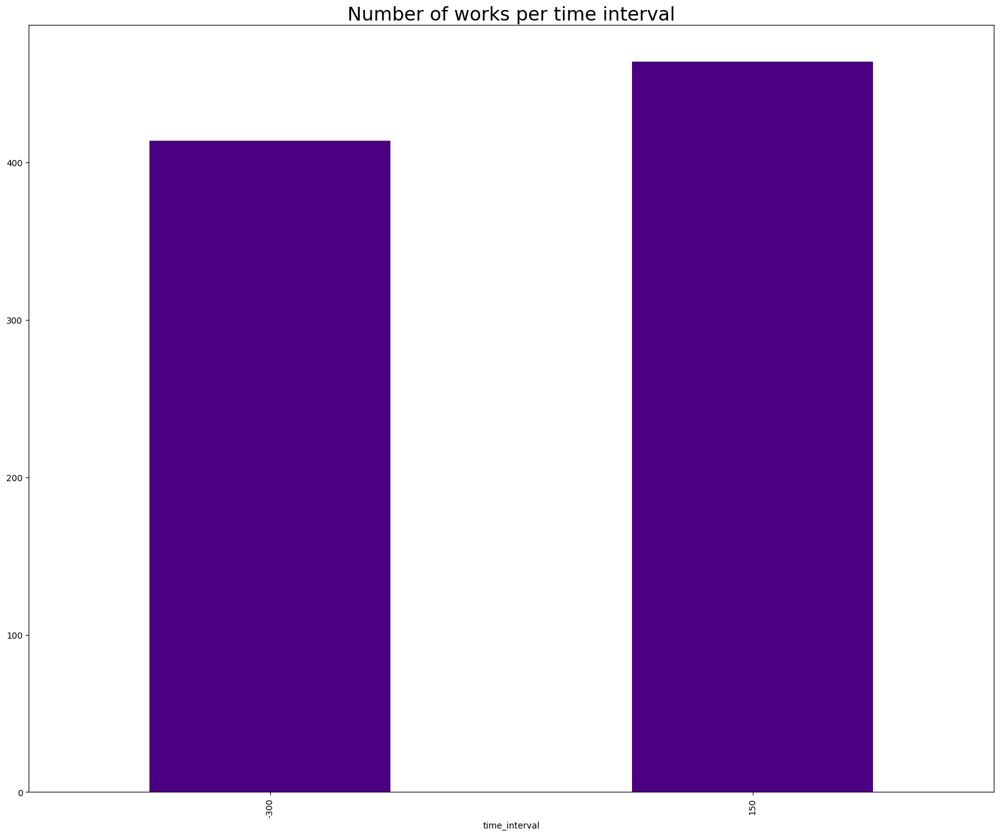

In [17]:
metadata_df0 = metadata_ph.groupby(['time_interval']).count()
metadata_df0 = metadata_df0['id']
metadata_df0
ax = metadata_df0.plot(kind='bar', figsize=(20,16), color="indigo", fontsize=10);
ax.set_title("Number of works per time interval", fontsize=22)
plt.show()

## Define Christian vs non-Christian texts within second time slice (150-600 CE)

### Christian subcorpus

Notes on which authors in IT corpus for Christian subcorpus (but should double-check if some texts need to be excluded within authors):

- 3rd century and earlier: Tertullian, Novatian, Minucius Felix, Arnobius, Lactantius, Commodian, Egeria, (not in IT, but maybe worth seeking out: Cyprian, Victorinus of Pettau, Itinerarium Burdigalense, Hyppolitus, Dyonisus + more texts from authors that are there)
- 4-6th century: St Jerome, St Ambrose, St Augustine, Prudentius, Sedulius, Boethius, Sulpicius Severus, Prosper Aquitanus, Paulinus of Nola~, Hydatius, Benedict of Nursia, Thomas of Edessa, Macarius of Alexandria, Eucherius of Lyon, Vincent de Lérins, Marcellinus Comes (weird formatting though), Apophthegmata (but only Macarius Magnus and Praefatio in IT), Cassiodorus (check which texts), Martin of Braga (check which texts), Gregory of Tours (??), Isidore of Seville (check which texts), (I am sure there are more potential texts outside of IT, but this is probably enough for now)

Notes on which authors in MQDQ corpus (but should check better about texts within authors):
- Unsure: Boethius
- Sure: Tertullian, Commodian, Lactantius, Laudes domini, Iuvencus, Proba, Marius Victorinus, Hilarius Pictaviensis, St Ambrose, Damasus, Prudentius, St Augustine, Paulinus of Nola, Pseudo Cyprian, Paulinus Pellaeus, Agrestius Gallus, Auspicius Tullensis, Carmen Sibyllinum, Cyprianus Gallus, Dracontius (partial), Paulinus Baeterrensis, Orientius, Paulinus Petricordiae, Prosper Aquitanus, Sedulius, Victorinus, Marius Victor, Sidonius Apollinaris, Ruricius Lemovicensis, Anonymous, Parthenius Africanus, Alcimus Avitus, Cyprianus Tolonensis, Remigius Remensis, Ennodius, Arator, Flavius Cabilonensis, Marcus Casinensis, Rusticius Helpidius, Severus Malacitanus, Columba, Columbanus, Martin of Braga, Marius of Avenches, Isidor of Seville

Select Christian texts from IT:

In [18]:
tertullian = ['LAT0058', 'LAT0062','LAT0246', 'LAT0248', 'LAT0256', 'LAT0350', 'LAT0448', 'LAT0606', 'LAT0733', 'LAT0736', 'LAT0737', 'LAT0744', 'LAT0746', 'LAT0747', 'LAT0749', 'LAT0750', 'LAT0755', 'LAT0788']
novatian = ['LAT0865']
minucius_felix = ['LAT0267']
arnobius = ['LAT0264']
lactantius = ['LAT0268']
commodian = ['LAT0607']
egeria = ['LAT0719']
auctor_incertus_1 = ['LAT0471', 'LAT0203']
early_selected_texts = tertullian + novatian + minucius_felix + arnobius + lactantius + commodian + egeria + auctor_incertus_1
jerome1 = ['LAT0001', 'LAT0001_1', 'LAT0001_2', 'LAT0001_3', 'LAT0001_4', 'LAT0001_5', 'LAT0001_6', 'LAT0001_7', 'LAT0001_8', 'LAT0001_9', 'LAT0001_10', 'LAT0001_11', 'LAT0001_12', 'LAT0001_13', 'LAT0001_14', 'LAT0001_15', 'LAT0001_16', 'LAT0001_17', 'LAT0001_18', 'LAT0001_19', 'LAT0001_20', 'LAT0001_21', 'LAT0001_22', 'LAT0001_23', 'LAT0001_24', 'LAT0001_25', 'LAT0001_26', 'LAT0001_27', 'LAT0001_28', 'LAT0001_29', 'LAT0001_30', 'LAT0001_31', 'LAT0001_32', 'LAT0001_33', 'LAT0001_34', 'LAT0001_35']
jerome2 = ['LAT0001_36', 'LAT0001_37', 'LAT0001_38', 'LAT0001_39', 'LAT0001_40', 'LAT0001_41', 'LAT0001_42', 'LAT0001_43', 'LAT0001_44', 'LAT0001_45', 'LAT0001_46', 'LAT0001_47', 'LAT0001_48', 'LAT0001_49', 'LAT0001_50', 'LAT0001_51', 'LAT0001_52', 'LAT0001_53', 'LAT0001_54', 'LAT0001_55', 'LAT0001_56', 'LAT0001_57', 'LAT0001_58', 'LAT0001_59', 'LAT0001_60', 'LAT0001_61', 'LAT0001_62', 'LAT0001_63', 'LAT0001_64', 'LAT0001_65', 'LAT0001_66', 'LAT0001_67', 'LAT0001_68', 'LAT0001_69', 'LAT1039', 'LAT0726', 'LAT0843', 'LAT0878', 'LAT0880']
augustine = ['LAT0061', 'LAT0793', 'LAT0016', 'LAT0015', 'LAT0397', 'LAT0403', 'LAT0768']
ambrose = ['LAT0263', 'LAT0847']
paulinus_nola = ['LAT0609']
sulpicius_severus = ['LAT0612', 'LAT0410']
apophthegmata = ['LAT0978']
hydatius = ['LAT0775', 'LAT0776']
macarius_alex = ['LAT1004']
prudentius = ['LAT0270']
prosper_aquit = ['LAT0610']
sedulius = ['LAT0414']
eucherius_lyon = ['LAT0608']
vincent_lerins = ['LAT0904']
# boethius = ['LAT0917']
benedict_nursia = ['LAT0011']
cassiodorus = ['LAT0250', 'LAT0251', 'LAT0252', 'LAT0243', 'LAT0482']
thomas_edessa = ['LAT0875']
marcellinus_comes = ['LAT0791']
gregory_tours = ['LAT0783']
martin_braga = ['LAT0990', 'LAT0990_1', 'LAT0990_2', 'LAT0990_3', 'LAT0990_4', 'LAT0990_5', 'LAT0990_6', 'LAT0990_7', 'LAT0990_8', 'LAT0990_9']
isidore_seville = ['LAT0908', 'LAT0909', 'LAT0957']
auctor_incertus_2 = ['LAT0383']
late_selected_texts = jerome1 + jerome2 + augustine + ambrose + paulinus_nola + sulpicius_severus + apophthegmata + hydatius + macarius_alex + prudentius + prosper_aquit + sedulius + eucherius_lyon + vincent_lerins + benedict_nursia + cassiodorus + thomas_edessa + marcellinus_comes + gregory_tours + martin_braga + isidore_seville + auctor_incertus_2 # + boethius
selected_texts_1 = early_selected_texts + late_selected_texts
selected_texts_1 = ['IT-'+f for f in selected_texts_1]
selected_texts_1

['IT-LAT0058',
 'IT-LAT0062',
 'IT-LAT0246',
 'IT-LAT0248',
 'IT-LAT0256',
 'IT-LAT0350',
 'IT-LAT0448',
 'IT-LAT0606',
 'IT-LAT0733',
 'IT-LAT0736',
 'IT-LAT0737',
 'IT-LAT0744',
 'IT-LAT0746',
 'IT-LAT0747',
 'IT-LAT0749',
 'IT-LAT0750',
 'IT-LAT0755',
 'IT-LAT0788',
 'IT-LAT0865',
 'IT-LAT0267',
 'IT-LAT0264',
 'IT-LAT0268',
 'IT-LAT0607',
 'IT-LAT0719',
 'IT-LAT0471',
 'IT-LAT0203',
 'IT-LAT0001',
 'IT-LAT0001_1',
 'IT-LAT0001_2',
 'IT-LAT0001_3',
 'IT-LAT0001_4',
 'IT-LAT0001_5',
 'IT-LAT0001_6',
 'IT-LAT0001_7',
 'IT-LAT0001_8',
 'IT-LAT0001_9',
 'IT-LAT0001_10',
 'IT-LAT0001_11',
 'IT-LAT0001_12',
 'IT-LAT0001_13',
 'IT-LAT0001_14',
 'IT-LAT0001_15',
 'IT-LAT0001_16',
 'IT-LAT0001_17',
 'IT-LAT0001_18',
 'IT-LAT0001_19',
 'IT-LAT0001_20',
 'IT-LAT0001_21',
 'IT-LAT0001_22',
 'IT-LAT0001_23',
 'IT-LAT0001_24',
 'IT-LAT0001_25',
 'IT-LAT0001_26',
 'IT-LAT0001_27',
 'IT-LAT0001_28',
 'IT-LAT0001_29',
 'IT-LAT0001_30',
 'IT-LAT0001_31',
 'IT-LAT0001_32',
 'IT-LAT0001_33',
 'IT-LAT00

Select Christian texts from MQDQ:

In [19]:
commodian = ['MQDQ-39', 'MQDQ-40', 'MQDQ-41']
tertullian = ['MQDQ-491', 'MQDQ-492']
lactantius = ['MQDQ-157', 'MQDQ-158', 'MQDQ-159']
laudes_dom = ['MQDQ-1']
iuvencus = ['MQDQ-151']
proba = ['MQDQ-350']
marius_vic = ['MQDQ-617']
hilarius_pic = ['MQDQ-117', 'MQDQ-118', 'MQDQ-119', 'MQDQ-120']
ambrose = ['MQDQ-179', 'MQDQ-180', 'MQDQ-181', 'MQDQ-182', 'MQDQ-183']
damasus = ['MQDQ-56']
prudentius = ['MQDQ-366', 'MQDQ-367', 'MQDQ-368', 'MQDQ-369', 'MQDQ-371', 'MQDQ-372', 'MQDQ-373', 'MQDQ-374', 'MQDQ-375']
augustine = ['MQDQ-512', 'MQDQ-513', 'MQDQ-514', 'MQDQ-515', 'MQDQ-516']
paulinus_nol = ['MQDQ-279', 'MQDQ-280', 'MQDQ-281', 'MQDQ-282']
pseud_cyp = ['MQDQ-379', 'MQDQ-380', 'MQDQ-381', 'MQDQ-382', 'MQDQ-383']
paulinus_pel = ['MQDQ-283', 'MQDQ-284']
agrestius_gal = ['MQDQ-66']
auspicius_tul = ['MQDQ-608']
carmen_sib = ['MQDQ-5']
cyprian_gal = ['MQDQ-48', 'MQDQ-49', 'MQDQ-50', 'MQDQ-51', 'MQDQ-52', 'MQDQ-53', 'MQDQ-54', 'MQDQ-55']
dracontius = ['MQDQ-59', 'MQDQ-60']
paulinus_bae = ['MQDQ-278']
orientius = ['MQDQ-242', 'MQDQ-243']
paulinus_pet = ['MQDQ-285', 'MQDQ-286', 'MQDQ-287']
prosper_aqu = ['MQDQ-360', 'MQDQ-361', 'MQDQ-362', 'MQDQ-363', 'MQDQ-364', 'MQDQ-365']
sedulius = ['MQDQ-422', 'MQDQ-423']
victorinus = ['MQDQ-564', 'MQDQ-565', 'MQDQ-566']
marius_vic = ['MQDQ-189']
sidonius = ['MQDQ-444', 'MQDQ-445']
ruricius_lem = ['MQDQ-111']
anonymous = ['MQDQ-140']
parthenius_afr = ['MQDQ-277']
alcimus_avi = ['MQDQ-622', 'MQDQ-623']
cyprianus_tol = ['MQDQ-621']
remigius_rem = ['MQDQ-618']
gildas = ['MQDQ-574', 'MQDQ-575']
# boethius = ['MQDQ-627', 'MQDQ-628']
ennodius = ['MQDQ-75', 'MQDQ-76', 'MQDQ-77', 'MQDQ-78', 'MQDQ-79', 'MQDQ-80', 'MQDQ-81', 'MQDQ-82', 'MQDQ-83', 'MQDQ-84', 'MQDQ-85', 'MQDQ-86']
arator = ['MQDQ-351', 'MQDQ-352', 'MQDQ-353', 'MQDQ-354', 'MQDQ-355']
flavius_cab = ['MQDQ-95']
marcus_cas = ['MQDQ-244']
rusticius_hel = ['MQDQ-415', 'MQDQ-416']
severus_mal = ['MQDQ-191']
columba = ['MQDQ-619']
columbanus = ['MQDQ-30', 'MQDQ-31', 'MQDQ-32', 'MQDQ-33', 'MQDQ-34', 'MQDQ-35']
martin_bra = ['MQDQ-209', 'MQDQ-210', 'MQDQ-211']
marius_ave = ['MQDQ-188']
isidore_sev = ['MQDQ-148']
selected_texts_2 = commodian + tertullian + lactantius + laudes_dom + iuvencus + proba + marius_vic + hilarius_pic + ambrose + damasus + prudentius + augustine + paulinus_nol + pseud_cyp + paulinus_pel + agrestius_gal + auspicius_tul + carmen_sib + cyprian_gal + dracontius + paulinus_bae + orientius + paulinus_pet + prosper_aqu + sedulius + victorinus + sidonius + ruricius_lem + anonymous + parthenius_afr + alcimus_avi + cyprianus_tol + remigius_rem + gildas + ennodius + arator + flavius_cab + marcus_cas + rusticius_hel + severus_mal + columba + columbanus + martin_bra + marius_ave + isidore_sev
selected_texts_2

['MQDQ-39',
 'MQDQ-40',
 'MQDQ-41',
 'MQDQ-491',
 'MQDQ-492',
 'MQDQ-157',
 'MQDQ-158',
 'MQDQ-159',
 'MQDQ-1',
 'MQDQ-151',
 'MQDQ-350',
 'MQDQ-189',
 'MQDQ-117',
 'MQDQ-118',
 'MQDQ-119',
 'MQDQ-120',
 'MQDQ-179',
 'MQDQ-180',
 'MQDQ-181',
 'MQDQ-182',
 'MQDQ-183',
 'MQDQ-56',
 'MQDQ-366',
 'MQDQ-367',
 'MQDQ-368',
 'MQDQ-369',
 'MQDQ-371',
 'MQDQ-372',
 'MQDQ-373',
 'MQDQ-374',
 'MQDQ-375',
 'MQDQ-512',
 'MQDQ-513',
 'MQDQ-514',
 'MQDQ-515',
 'MQDQ-516',
 'MQDQ-279',
 'MQDQ-280',
 'MQDQ-281',
 'MQDQ-282',
 'MQDQ-379',
 'MQDQ-380',
 'MQDQ-381',
 'MQDQ-382',
 'MQDQ-383',
 'MQDQ-283',
 'MQDQ-284',
 'MQDQ-66',
 'MQDQ-608',
 'MQDQ-5',
 'MQDQ-48',
 'MQDQ-49',
 'MQDQ-50',
 'MQDQ-51',
 'MQDQ-52',
 'MQDQ-53',
 'MQDQ-54',
 'MQDQ-55',
 'MQDQ-59',
 'MQDQ-60',
 'MQDQ-278',
 'MQDQ-242',
 'MQDQ-243',
 'MQDQ-285',
 'MQDQ-286',
 'MQDQ-287',
 'MQDQ-360',
 'MQDQ-361',
 'MQDQ-362',
 'MQDQ-363',
 'MQDQ-364',
 'MQDQ-365',
 'MQDQ-422',
 'MQDQ-423',
 'MQDQ-564',
 'MQDQ-565',
 'MQDQ-566',
 'MQDQ-444',
 'MQD

Merge Christian texts from IT and MQDQ:

In [20]:
selected_texts = selected_texts_1 + selected_texts_2
len(selected_texts)

267

Print to csv:

In [21]:
metadata_ph_christian = metadata_ph[(metadata_ph['id'].isin(selected_texts))]
metadata_ph_christian
metadata_ph_christian.to_csv(os.path.join(dir_out, 'metadata_christian.csv'), index=None)

### Non-Christian subcorpus

Select post 150 CE non-Christian texts by exclusion and display metadata:

In [22]:
metadata_ph_nonchristian = metadata_ph[(metadata_ph['time_interval']==150) & (~metadata_ph['id'].isin(selected_texts))]
metadata_ph_nonchristian

,id,title,creator,date,type,file,time_interval
421,IT-LAT0360,Noctes Atticae,"Gellius, Aulus",150,prose,lat_0150_IT-LAT0360.txt,150
422,IT-LAT0406,De nugis philosophorum,"Balbus, [Pseudo-] Caecilius",150,prose,lat_0150_IT-LAT0406.txt,150
423,IT-LAT0407,Quaestiones,"Caecilius Africanus, Sextus",150,prose,lat_0150_IT-LAT0407.txt,150
424,IT-LAT0916,De verbis dubiis,"Caper, Flavius",150,prose,lat_0150_IT-LAT0916.txt,150
425,MQDQ-223,carminum fragmenta,unknown,150,poetry,lat_0150.0_MQDQ-223.txt,150
...,...,...,...,...,...,...,...
869,MQDQ-347,carmen in laudem Anastasii imperatoris,Priscianus,550,poetry,lat_0550.0_MQDQ-347.txt,150
870,MQDQ-348,carminis fragmentum,Priscianus,550,poetry,lat_0550.0_MQDQ-348.txt,150
871,MQDQ-346,perihegesis,Priscianus,550,poetry,lat_0550.0_MQDQ-346.txt,150
875,MQDQ-475,sylloge cod. Elnonensis,sylloge cod. Elnonensis,550,poetry,lat_0550.0_MQDQ-475.txt,150


In [23]:
nonchristian_selected_texts = list(metadata_ph_nonchristian['id'])
nonchristian_selected_texts

['IT-LAT0360',
 'IT-LAT0406',
 'IT-LAT0407',
 'IT-LAT0916',
 'MQDQ-223',
 'MQDQ-490',
 'MQDQ-240',
 'MQDQ-293',
 'MQDQ-345',
 'MQDQ-470',
 'MQDQ-465',
 'MQDQ-471',
 'MQDQ-467',
 'MQDQ-466',
 'MQDQ-469',
 'MQDQ-472',
 'MQDQ-468',
 'IT-LAT0043',
 'MQDQ-540',
 'IT-LAT0201',
 'IT-LAT0204',
 'IT-LAT0621',
 'IT-LAT0665',
 'IT-LAT0846',
 'IT-LAT0913',
 'IT-LAT0914',
 'MQDQ-123',
 'MQDQ-138',
 'MQDQ-234',
 'MQDQ-233',
 'MQDQ-232',
 'MQDQ-343',
 'MQDQ-344',
 'MQDQ-558',
 'IT-LAT0893',
 'IT-LAT0895',
 'IT-LAT0896',
 'IT-LAT0351',
 'MQDQ-107',
 'MQDQ-447',
 'MQDQ-87',
 'MQDQ-241',
 'MQDQ-290',
 'MQDQ-377',
 'MQDQ-378',
 'MQDQ-393',
 'MQDQ-499',
 'MQDQ-500',
 'MQDQ-563',
 'IT-LAT0886',
 'MQDQ-166',
 'MQDQ-149',
 'IT-LAT0115',
 'IT-LAT0233',
 'IT-LAT0238',
 'IT-LAT0286',
 'IT-LAT0353',
 'IT-LAT0361',
 'IT-LAT0362',
 'IT-LAT0364',
 'IT-LAT0365',
 'IT-LAT0366',
 'IT-LAT0367',
 'IT-LAT0850',
 'IT-LAT0919',
 'MQDQ-569',
 'MQDQ-570',
 'MQDQ-571',
 'MQDQ-573',
 'MQDQ-10',
 'MQDQ-609',
 'MQDQ-192',
 'MQDQ

## Make corpus and subcorpora

### Whole corpus

Define punctuation for stripping from corpus:

In [24]:
punctuation = ['.', ',', '...', ';', ':', '?', '(', ')', '-', '!', '[', ']', '"', "'", '""', '\n', '']

There are two methods for making corpora below. One outputs generators ("K's method"), the other lists ("B's method"). If using K's method, generators will need to be converted to lists before being inputted into BERT.

In [25]:
# K's method (step 1: define class)
class NltkCorpusFromDirNew(PlaintextCorpusReader):
    "A subclass of NLTK PlaintextCorpusReader"
    
    word_tokenizer=SpaceTokenizer() # tokenize on whitespace
    sent_tokenizer=LineTokenizer() # assume sentence per line
    
    def __init__(
        self,
        root,
        fileids,
        encoding="utf8",        
        word_tokenizer=word_tokenizer,
        sent_tokenizer=sent_tokenizer,
        tolower=False, punctuation=None
    ):

        PlaintextCorpusReader.__init__(self, root=root, fileids=fileids, encoding=encoding,
                                       word_tokenizer=word_tokenizer,
                                       sent_tokenizer=sent_tokenizer)
        self.tolower = tolower
        self.punctuation = punctuation
        
    def _read_word_block(self, stream):
        words = []
        for i in range(20):  # Read 20 lines at a time.
            if self.punctuation is not None:
                words.extend( [ token.lower() if self.tolower == True else token for token 
                               in self._word_tokenizer.tokenize(stream.readline()) 
                               if token not in self.punctuation and token != '' 
                              ])
            else:
                words.extend( [ token.lower() if self.tolower == True else token for token in self._word_tokenizer.tokenize(stream.readline()) ])
        return words

In [26]:
# # K's method (step 2: output a list of generators) 
# Generators are problematic for BERT, so we need to convert them to lists if using this option.

# filenames_ph = metadata_ph['file']
# dir_in_2 = os.path.join(dir_in, "preprocessed_lemmas_2024")

# # Prepare the corpus
# latinise = NltkCorpusFromDirNew(root=dir_in_2, fileids=filenames_ph,
#                                 punctuation=punctuation, tolower=True)
# latinise_docs = []
# for fileid in latinise.fileids():
#     latinise_docs.append(Text(latinise.words(fileid)))
# print("This corpus contains ", len(latinise_docs), " documents.")

# # Add to the corpus
# corpus = list()
# for sent in latinise.sents():
#     corpus.append(token.lower() for token in sent if token not in punctuation and token != '')

In [27]:
# B's method (outputs a list of lists) – Q: should we default to lowercase or not? There are pros and cons...
corpus = list()
files_corpus = metadata_ph
for index, df_line in files_corpus.iterrows():
    sign = "+"
    if df_line['date'] < 0:
        sign = "-"
    file_name = df_line['file']
    file = open(os.path.join(dir_in, "preprocessed_"+lemmas_or_tokens+"_2024", file_name), 'r')
    while True:
        line = file.readline().strip()
        if line != "":
            corpus.append([token for token in line.split(" ") if token not in punctuation])
        if not line:
            break
    file.close()

### Time subcorpora

In [28]:
# # K's method
# time2corpus = dict()

# # I loop over all time intervals:
# for t in range(n_intervals):
#     files_corpus_t = list(metadata_ph.loc[metadata_ph['time_interval'] == intervals[t]]["file"])
#     print("retrieving the subcorpus for interval ", intervals[t])
#     sents = latinise.sents(fileids=files_corpus_t)
#     sents_clean = list()
#     for sent in sents:
#         sents_clean.append( [ token.lower()  for token in sent if token not in punctuation and token != ''  ] )
#     time2corpus[t] = sents_clean

In [29]:
# B's method
time2corpus = dict()

# Loop over all time intervals:
for t in range(n_intervals+1):
    files_corpus_t = metadata_ph.loc[metadata_ph['time_interval'] == intervals[t]]
    corpus_t = list()
    for index, df_line in files_corpus_t.iterrows():
        sign = "+"
        if df_line['date'] < 0:
            sign = "-"
        file_name = df_line['file']
        file = open(os.path.join(dir_in, "preprocessed_"+lemmas_or_tokens+"_2024", file_name), 'r')
        sentences_this_file = list()
        while True:
            line = file.readline().strip()
            if line != "":
                corpus_t.append([token for token in line.split(" ") if token not in punctuation])
            # if line is empty end of file is reached
            if not line:
                break
        file.close()
    time2corpus[t] = corpus_t

Check token balance

In [30]:
# Number of sentences in the first time interval
len(time2corpus[0])

204795

In [31]:
# Number of words in the first time interval
num_words_int_0 = sum(len(i) for i in time2corpus[0])
num_words_int_0

3661252

In [32]:
# Number of sentences in the second time interval
len(time2corpus[1])

218177

In [33]:
# Number of words in the second time interval
num_words_int_1 = sum(len(i) for i in time2corpus[1])
num_words_int_1

3109903

In [34]:
# Sentence count ratio
len(time2corpus[0])/len(time2corpus[1])

0.9386644788405744

In [35]:
# Word count ratio
num_words_int_0/num_words_int_1

1.1772881662225478

### (Non-)Christian subcorpora

In [36]:
# # K's method: christian corpus
# filenames_ph_christian = metadata_ph_christian['file']

# #prepare the corpus
# latinise = NltkCorpusFromDirNew(root=dir_in_2, fileids=filenames_ph_christian,
#                                 punctuation=punctuation, tolower=True)
# latinise_docs = []
# for fileid in latinise.fileids():
#     latinise_docs.append(Text(latinise.words(fileid)))
# print("This corpus contains ", len(latinise_docs), " documents.")

# # Add to the corpus
# christian_corpus = list()
# for sent in latinise.sents():
#     christian_corpus.append(token.lower() for token in sent if token not in punctuation and token != '')

In [37]:
# B's method: christian corpus
corpus_christi = list()
files_corpus_christi = metadata_ph_christian
for index, df_line in files_corpus_christi.iterrows():
    sign = "+"
    if df_line['date'] < 0:
        sign = "-"
    file_name = df_line['file']
    file = open(os.path.join(dir_in, "preprocessed_"+lemmas_or_tokens+"_2024", file_name), 'r')
    sentences_this_file = list()
    while True:
        line = file.readline().strip()
        if line != "":
            corpus_christi.append([token for token in line.split(" ") if token not in punctuation])
        # if line is empty end of file is reached
        if not line:
            break
    file.close()
corpus_christi.append(sentences_this_file)

In [38]:
# # K's method: non-christian corpus
# filenames_ph_nonchristian = metadata_ph_nonchristian['file']

# #prepare the corpus
# latinise = NltkCorpusFromDirNew(root=dir_in_2, fileids=filenames_ph_nonchristian,
#                                 punctuation=punctuation, tolower=True)
# latinise_docs = []
# for fileid in latinise.fileids():
#     latinise_docs.append(Text(latinise.words(fileid)))
# print("This corpus contains ", len(latinise_docs), " documents.")

# # Add to the corpus
# nonchristian_corpus = list()
# for sent in latinise.sents():
#     nonchristian_corpus.append(token.lower() for token in sent if token not in punctuation and token != '')

In [39]:
# B's method: non-christian corpus
corpus_non_christi = list()
files_corpus_non_christi = metadata_ph_nonchristian
for index, df_line in files_corpus_non_christi.iterrows():
    sign = "+"
    if df_line['date'] < 0:
        sign = "-"
    file_name = df_line['file'] 
    file = open(os.path.join(dir_in, "preprocessed_"+lemmas_or_tokens+"_2024", file_name), 'r')
    sentences_this_file = list()
    while True:
        line = file.readline().strip()
        if line != "":
            corpus_non_christi.append([token for token in line.split(" ") if token not in punctuation])
        # if line is empty end of file is reached
        if not line:
            break
    file.close()
corpus_non_christi.append(sentences_this_file)

Check token balance

In [40]:
len(corpus_christi)

99464

In [41]:
num_words_corpus_christi = sum(len(i) for i in corpus_christi)
num_words_corpus_christi

1738041

In [42]:
len(corpus_non_christi)

118715

In [43]:
num_words_corpus_non_christi = sum(len(i) for i in corpus_non_christi)
num_words_corpus_non_christi

1371862

In [44]:
len(corpus_christi)/len(corpus_non_christi)

0.8378385208271911

In [45]:
num_words_corpus_christi/num_words_corpus_non_christi

1.266921162624229

## Pre-trained LatinBERT 

### Calculate or load embeddings

First time slice (300 BCE to 150 CE):

In [46]:
output_file_1 = os.path.join(dir_out, "bert_t0_results.pickle")
if rebuild == True: 
    # Define the paths to your tokenizer and BERT model
    tokenizer_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "subword_tokenizer_latin", "latin.subword.encoder") 
    bert_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "latin_bert") 

    # Initialize the LatinBERT class
    latin_bert = LatinBERT(tokenizerPath=tokenizer_path, bertPath=bert_path)

    # Define the maximum sequence length (longer sentences will be truncated to avoid memory errors)
    max_seq_length = 512

    # Flatten the lists into strings
    flattened_time2corpus0 = [' '.join(sent)[:max_seq_length] for sent in time2corpus[0]]

    # Process the corpus using the get_berts method
    bert_sents_t0 = latin_bert.get_berts(flattened_time2corpus0)

    # Save the results to a pickle file

    with open(output_file_1, 'wb') as f:
        pickle.dump(bert_sents_t0,f)
    print(f"Results saved to {output_file_1}")

elif rebuild == False:
    with open(output_file_1, 'rb') as f:
        bert_sents_t0 = pickle.load(f)

Second time slice (150 to 600 CE):

In [47]:
output_file_2 = os.path.join(dir_out, "bert_t1_results.pickle")
if rebuild == True: 
    # Define the paths to your tokenizer and BERT model
    tokenizer_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "subword_tokenizer_latin", "latin.subword.encoder") 
    bert_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "latin_bert") 

    # Initialize the LatinBERT class
    latin_bert = LatinBERT(tokenizerPath=tokenizer_path, bertPath=bert_path)

    # Define the maximum sequence length (longer sentences will be truncated to avoid memory errors)
    max_seq_length = 512

    # Flatten the lists into strings
    flattened_time2corpus1 = [' '.join(sent)[:max_seq_length] for sent in time2corpus[1]]

    # Process the corpus using the get_berts method
    bert_sents_t1 = latin_bert.get_berts(flattened_time2corpus1)

    # Save the results to a pickle file

    with open(output_file_2, 'wb') as f:
        pickle.dump(bert_sents_t1,f)
    print(f"Results saved to {output_file_2}")

elif rebuild == False:
    with open(output_file_2, 'rb') as f:
        bert_sents_t1 = pickle.load(f)

Christian subcorpus:

In [48]:
output_file_3 = os.path.join(dir_out, "bert_christi_results.pickle")
if rebuild == True: 
    # Define the paths to your tokenizer and BERT model
    tokenizer_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "subword_tokenizer_latin", "latin.subword.encoder") 
    bert_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "latin_bert") 

    # Initialize the LatinBERT class
    latin_bert = LatinBERT(tokenizerPath=tokenizer_path, bertPath=bert_path)

    # Define the maximum sequence length (longer sentences will be truncated to avoid memory errors)
    max_seq_length = 512

    # Flatten the lists into strings
    flattened_corpus_christi = [' '.join(sent)[:max_seq_length] for sent in corpus_christi]

    # Process the corpus using the get_berts method
    bert_sents_christi = latin_bert.get_berts(flattened_corpus_christi)

    # Save the results to a pickle file

    with open(output_file_3, 'wb') as f:
        pickle.dump(bert_sents_christi,f)
    print(f"Results saved to {output_file_3}")

elif rebuild == False:
    with open(output_file_3, 'rb') as f:
        bert_sents_christi = pickle.load(f)

Non-christian subcorpus:

In [49]:
output_file_4 = os.path.join(dir_out, "bert_non_christi_results.pickle")
if rebuild == True: 
    # Define the paths to your tokenizer and BERT model
    tokenizer_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "subword_tokenizer_latin", "latin.subword.encoder") 
    bert_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "latin_bert") 

    # Initialize the LatinBERT class
    latin_bert = LatinBERT(tokenizerPath=tokenizer_path, bertPath=bert_path)

    # Define the maximum sequence length (longer sentences will be truncated to avoid memory errors)
    max_seq_length = 512

    # Flatten the lists into strings
    flattened_corpus_non_christi = [' '.join(sent)[:max_seq_length] for sent in corpus_non_christi]

    # Process the corpus using the get_berts method
    bert_sents_non_christi = latin_bert.get_berts(flattened_corpus_non_christi)

    # Save the results to a pickle file

    with open(output_file_4, 'wb') as f:
        pickle.dump(bert_sents_non_christi,f)
    print(f"Results saved to {output_file_4}")

elif rebuild == False:
    with open(output_file_4, 'rb') as f:
        bert_sents_non_christi = pickle.load(f)

Check how many sentences were chopped off (result: 2 in the whole corpus)

In [50]:
# Function to check if any sentence in the corpus is longer than the maximum sequence length
def check_sentence_lengths(corpus, max_length):
    count = 0
    for i, sentence in enumerate(corpus):
        # Flatten the sentence into a single string and tokenize it
        flattened_sentence = ' '.join(sentence)
        tokens = flattened_sentence.split()  # Assuming tokens are separated by spaces
        if len(tokens) > max_length:
            print(f"Sentence {i} is longer than {max_length} tokens with {len(tokens)} tokens.")
            count += 1
    return count

# Corpus variables are: time2corpus[0], time2corpus[1], corpus_christi, corpus_non_christi, corpus
max_seq_length = 512
long_sentences_count = check_sentence_lengths(corpus, max_seq_length)
if long_sentences_count > 0:
    print(f"There are {long_sentences_count} sentences longer than the maximum sequence length.")
else:
    print("All sentences are within the maximum sequence length.")

Sentence 22688 is longer than 512 tokens with 609 tokens.
Sentence 299388 is longer than 512 tokens with 664 tokens.
There are 2 sentences longer than the maximum sequence length.


### Average embeddings

Let's try to average embeddings for each word type (also saved to pickle file).

Starting with the first time slice:

In [51]:
average_embeddings_file_t0 = os.path.join(dir_out, "average_embeddings_t0.pickle")

# Dictionary to store embeddings for each word type
word_embeddings_t0 = defaultdict(list)
    
# Collect all embeddings for each word type and count word frequencies
word_counter = Counter()
for sent in bert_sents_t0:
    for token, embedding in sent:
        word_embeddings_t0[token].append(embedding)
        word_counter[token] += 1

if rebuild == True:
    # Compute the average embedding for each word type
    average_embeddings_t0 = {}
    for word, embeddings in word_embeddings_t0.items():
        embeddings_array_t0 = np.array(embeddings)
        average_embeddings_t0[word] = np.mean(embeddings_array_t0, axis=0)

    # Save the average embeddings to a pickle file
    with open(average_embeddings_file_t0, 'wb') as f:
        pickle.dump(average_embeddings_t0, f)

    print(f"Average embeddings saved to {average_embeddings_file_t0}")

elif rebuild == False:
    with open(average_embeddings_file_t0, 'rb') as f:
        average_embeddings_t0 = pickle.load(f)
        
# Get the ten most frequent words
most_frequent_words_t0 = [word for word, _ in word_counter.most_common(10)]

# Print the embeddings for the ten most frequent words
for word in most_frequent_words_t0:
    embedding = average_embeddings_t0[word]
    print(f"Word: {word}")
    print(f"Embedding: {embedding}\n")

Word: [CLS]
Embedding: [ 1.73574295e-02 -3.42280626e-01  4.32026476e-01  5.84698543e-02
 -6.35961890e-02 -5.89532256e-01 -1.09487008e-02 -6.43494070e-01
  1.35350497e-02 -3.19944471e-01  6.52624741e-02  1.45798087e-01
 -8.08876678e-02 -2.63947755e-01  2.20692083e-02  8.80702734e-01
  1.08252941e-02 -3.34437162e-01 -6.82313979e-01  1.21219444e+00
 -3.27484727e-01  8.74741301e-02  2.73741484e-01 -8.83853957e-02
  1.67739898e-01 -1.85005933e-01 -4.15785760e-01  2.16154143e-01
  9.05389845e-01 -1.83229759e-01  7.97350928e-02  1.42681062e-01
 -1.01870291e-01 -1.14218906e-01 -7.47517645e-02 -2.65430152e-01
 -2.42925212e-01 -1.32679313e-01  5.39060831e-01  6.06085539e-01
 -3.55794698e-01  3.04078292e-02 -3.82784486e-01 -2.31334090e-01
 -1.09606303e-01 -3.09395373e-01  1.62306011e-01 -2.38561794e-01
 -3.76746088e-01  1.13545179e-01 -2.21992150e-01  2.65497365e-03
  1.67396180e-02  5.20452149e-02  6.96838498e-01 -1.98455468e-01
  6.89362288e-01  7.87934959e-02 -6.26164749e-02 -4.68895212e-02
 -

And following with the second time slice:

In [52]:
average_embeddings_file_t1 = os.path.join(dir_out, "average_embeddings_t1.pickle")

# Dictionary to store embeddings for each word type
word_embeddings_t1 = defaultdict(list)
    
# Collect all embeddings for each word type and count word frequencies
word_counter = Counter()
for sent in bert_sents_t1:
    for token, embedding in sent:
        word_embeddings_t1[token].append(embedding)
        word_counter[token] += 1

if rebuild == True:
    # Compute the average embedding for each word type
    average_embeddings_t1 = {}
    for word, embeddings in word_embeddings_t1.items():
        embeddings_array_t1 = np.array(embeddings)
        average_embeddings_t1[word] = np.mean(embeddings_array_t1, axis=0)

    # Save the average embeddings to a pickle file
    with open(average_embeddings_file_t1, 'wb') as f:
        pickle.dump(average_embeddings_t1, f)

    print(f"Average embeddings saved to {average_embeddings_file_t1}")

elif rebuild == False:
    with open(average_embeddings_file_t1, 'rb') as f:
        average_embeddings_t1 = pickle.load(f)
        
# Get the ten most frequent words
most_frequent_words_t1 = [word for word, _ in word_counter.most_common(10)]

# Print the embeddings for the ten most frequent words
for word in most_frequent_words_t1:
    embedding = average_embeddings_t1[word]
    print(f"Word: {word}")
    print(f"Embedding: {embedding}\n")

Word: [CLS]
Embedding: [-4.75425012e-02 -1.56774759e-01  4.38540488e-01 -5.96564114e-02
 -1.10347711e-01 -5.42740166e-01 -2.90355980e-02 -5.43017685e-01
 -1.16432369e-01 -3.46717864e-01  1.26367025e-02  1.23929404e-01
 -6.83489963e-02 -1.48912758e-01  1.93530899e-02  6.70511484e-01
  3.28136049e-02 -2.58738071e-01 -5.42684972e-01  1.15567231e+00
 -2.76383698e-01  1.98617011e-01  4.43795621e-02 -2.29112267e-01
  7.48869702e-02 -2.46720120e-01 -4.73189235e-01  1.16124697e-01
  1.02951646e+00 -1.59146726e-01 -4.78466898e-02  1.10355861e-01
 -4.19409759e-02 -2.00246900e-01  4.73801047e-02 -1.24983035e-01
 -3.48808616e-01 -1.40783563e-01  4.86796349e-01  5.23698568e-01
 -4.02023435e-01  1.46788269e-01 -1.80976212e-01 -2.10538253e-01
 -3.38546224e-02 -2.61314303e-01  1.87092751e-01 -2.12612540e-01
 -1.22601494e-01  6.02849945e-03 -2.35477671e-01 -2.16276363e-01
 -1.12636071e-02  3.20712030e-02  5.89409173e-01 -3.01573128e-01
  6.97168350e-01  8.10059980e-02 -2.06429526e-01 -3.29856807e-03
 -

In [53]:
# Get the ten most frequent words
most_frequent_words_t1_try = [word for word, _ in word_counter.most_common(500)]

# Print the embeddings for the ten most frequent words
for word in most_frequent_words_t1_try:
    embedding = average_embeddings_t1[word]
    print(f"Word: {word}")

Word: [CLS]
Word: [SEP]
Word: et
Word: sum
Word: in
Word: quis#2
Word: is
Word: non
Word: hic
Word: ab
Word: ad
Word: ut
Word: cum
Word: si
Word: suus
Word: de
Word: quod
Word: ille
Word: omnis
Word: dico#2
Word: sed
Word: deus
Word: ipse
Word: facio
Word: ex
Word: -ne
Word: ego
Word: per
Word: se
Word: vel
Word: tu
Word: autem
Word: dominus
Word: nec
Word: atque
Word: possum
Word: tuus
Word: qui
Word: enim
Word: habeo
Word: filius
Word: do
Word: imperator
Word: cj
Word: quam#4
Word: alius
Word: aut
Word: meus
Word: rex
Word: video
Word: res
Word: homo
Word: quia
Word: nos
Word: dies
Word: etiam
Word: multus
Word: noster
Word: pater
Word: iam
Word: terra
Word: unus
Word: tempus
Word: pro
Word: post
Word: vos
Word: venio
Word: nomen
Word: conss
Word: verus
Word: ne#2
Word: magnus
Word: locus
Word: bonus
Word: tamen
Word: quo
Word: sic
Word: idem
Word: super
Word: d
Word: ita
Word: nullus
Word: kalendae
Word: pars
Word: christus
Word: manus
Word: primus
Word: quoque
Word: vir
Word: verbu

#### Cosine similarity for averaged embeddings

Now find cosine similarity / cosine distance between t0 and t1 averaged vectors.

Two methods, one using sklearn (similarity), one using scipy(distance) – 1-distance would obviously yield the same, just trying different packages:

In [54]:
# Compute cosine similarity for each token that appears in both sets of embeddings
cosine_similarities_t0t1 = {}
for token in average_embeddings_t0:
    if token in average_embeddings_t1:
        embedding_t0 = average_embeddings_t0[token].reshape(1, -1)
        embedding_t1 = average_embeddings_t1[token].reshape(1, -1)
        similarity = cosine_similarity(embedding_t0, embedding_t1)[0][0]
        cosine_similarities_t0t1[token] = similarity

# Print the cosine similarities for each token
for token, similarity in cosine_similarities_t0t1.items():
    print(f"Token: {token}, Cosine Similarity: {similarity}")

Token: [CLS], Cosine Similarity: 0.9809601306915283
Token: amicus, Cosine Similarity: 0.9886429309844971
Token: cum, Cosine Similarity: 0.9951936602592468
Token: video, Cosine Similarity: 0.9898796081542969
Token: obliuiscere, Cosine Similarity: 0.8792696595191956
Token: miseria, Cosine Similarity: 0.9824851155281067
Token: inimicus, Cosine Similarity: 0.9762231707572937
Token: si, Cosine Similarity: 0.9915624260902405
Token: sum, Cosine Similarity: 0.9946156144142151
Token: commentus, Cosine Similarity: 0.9713641405105591
Token: nec, Cosine Similarity: 0.9955240488052368
Token: libet, Cosine Similarity: 0.992981493473053
Token: aequus, Cosine Similarity: 0.9945555925369263
Token: [SEP], Cosine Similarity: 0.9674364924430847
Token: postremus, Cosine Similarity: 0.9658192992210388
Token: dico#2, Cosine Similarity: 0.9920896291732788
Token: primus, Cosine Similarity: 0.9941133260726929
Token: taceo, Cosine Similarity: 0.9930532574653625
Token: apud, Cosine Similarity: 0.9880231618881226


In [55]:
# Write the cosine similarities to a CSV file
cosine_sim_csv = os.path.join(dir_out, "cosine_similarities_t0t1.csv")

with open(cosine_sim_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "Cosine Similarity"])  # Write the header
    for token, similarity in cosine_similarities_t0t1.items():
        writer.writerow([token, similarity])

print(f"Cosine similarities saved to {cosine_sim_csv}")

Cosine similarities saved to /Users/valentinalunardi/Documents/UCLA_PhD/Thesis/Metadata_corrections/bert_tests/output/cosine_similarities_t0t1.csv


In [56]:
# Compute cosine distance for each token that appears in both sets of embeddings
cosine_distances_t0t1 = {}
for token in average_embeddings_t0:
    if token in average_embeddings_t1:
        embedding_t0 = average_embeddings_t0[token]
        embedding_t1 = average_embeddings_t1[token]
        distance = cosine(embedding_t0, embedding_t1)
        cosine_distances_t0t1[token] = distance

# Print the cosine distances for each token
for token, distance in cosine_distances_t0t1.items():
    print(f"Token: {token}, Cosine Distance: {distance}")

Token: [CLS], Cosine Distance: 0.01903986930847168
Token: amicus, Cosine Distance: 0.01135706901550293
Token: cum, Cosine Distance: 0.0048062801361083984
Token: video, Cosine Distance: 0.0101204514503479
Token: obliuiscere, Cosine Distance: 0.12073034048080444
Token: miseria, Cosine Distance: 0.017515122890472412
Token: inimicus, Cosine Distance: 0.023776769638061523
Token: si, Cosine Distance: 0.008437633514404297
Token: sum, Cosine Distance: 0.005384266376495361
Token: commentus, Cosine Distance: 0.028635859489440918
Token: nec, Cosine Distance: 0.004475951194763184
Token: libet, Cosine Distance: 0.0070185065269470215
Token: aequus, Cosine Distance: 0.005444347858428955
Token: [SEP], Cosine Distance: 0.032563626766204834
Token: postremus, Cosine Distance: 0.03418034315109253
Token: dico#2, Cosine Distance: 0.007910490036010742
Token: primus, Cosine Distance: 0.005886673927307129
Token: taceo, Cosine Distance: 0.006946682929992676
Token: apud, Cosine Distance: 0.011976778507232666
Tok

In [57]:
# Write the cosine distances to a CSV file
cosine_dist_csv = os.path.join(dir_out, "cosine_distances_t0t1.csv")

with open(cosine_dist_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "Cosine Similarity"])  # Write the header
    for token, similarity in cosine_distances_t0t1.items():
        writer.writerow([token, similarity])

print(f"Cosine distances saved to {cosine_dist_csv}")

Cosine distances saved to /Users/valentinalunardi/Documents/UCLA_PhD/Thesis/Metadata_corrections/bert_tests/output/cosine_distances_t0t1.csv


#### TODO: think about outher ways to measure similarity:

I think it might be common to use inverted cosine similarity these days, judging from some papers, but we need to look into this. It's referred to as PRT (inverted cosine similarity over word prototypes) – the word prototypes being the averaged embeddings in the separate time frames.

There is also something known as APD (average pairwise cosine distance), which I think might avoid averaging, or rather does averaging of cosine distances rather than of embeddings...

### Cluster embeddings

In principle clustering embeddings would allow us to detect different word senses (for each word type, a cluster corresponds to a sense, and there should technically be one cluster per meaning, though see https://doi.org/10.3384/nejlt.2000-1533.2022.3478). However, there are a few issues with clustering, summarized as follows:
- We can set the number of cluster to be found for each word arbitrarily: this will likely not correspond to the number of senses each word has, but it might make it easier to deal with word similarity measurement. (Still, not ideal.)
- If we instead optimize the number of clusters for each word, the number of clusters/senses might not to be the same for a single word across different time slices or subcorpora, meaning comparison is more difficult (i.e. what are we comparing? should one do pairwise comparison or something else?)
- Something we could try and adapt for this second option (but not sure) is the code from Giulianelli et al. (2020): https://github.com/glnmario/cwr4lsc/tree/master. However, keep in mind that the structure of bert_sents is different from what they set up, so we need to modify bert_sents to make it look like their `usages` dictionary, or otherwise make their clustering code work with the bert_sents structure.

These are issues that need to be addressed before moving forward, but below are some tests.

Define clustering function:

In [58]:
# Function to cluster embeddings for each word
def cluster_embeddings(word_embeddings, num_clusters=3):
    clustered_embeddings = {}
    for word, embeddings in word_embeddings.items():
        if len(embeddings) < num_clusters:
            # If there are fewer embeddings than clusters, use the embeddings as they are
            clustered_embeddings[word] = embeddings
        else:
            # Convert list of embeddings to a numpy array
            embeddings_array = np.array(embeddings)
            # Apply K-Means clustering
            kmeans = KMeans(n_clusters=num_clusters, random_state=0)
            kmeans.fit(embeddings_array)
            # Use cluster centroids as sense embeddings
            clustered_embeddings[word] = kmeans.cluster_centers_
    return clustered_embeddings

TODO: we need to figure out what counts as a cluster. (1) maybe we need to set some kind of minimum threshold, if `kmeans` does not deal with that (if there are, say, two rogue embeddings that are close together but far from a cluster, do those count as a separate sense or are they just rogue?) (2) I am assuming `kmeans` does not make the clusters be of the same size (we would just want them to be of whatever size makes sense, save for the min threshold), but this should be checked. Obviously this ties into the issue about how many clusters there should be.

The following few cells find 3 clusters for each word type in both t0 and t1.

In [59]:
clustered_embeddings_file_t0 = os.path.join(dir_out, "clustered_embeddings_t0.pickle")

# Dictionary to store embeddings for each word type
word_embeddings = defaultdict(list)

# Collect all embeddings for each word type
for sent in bert_sents_t0:
    for token, embedding in sent:
        word_embeddings[token].append(embedding)

if rebuild == True:
    # Cluster the embeddings for each word
    num_clusters = 3  # number of clusters???
    clustered_embeddings_t0 = cluster_embeddings(word_embeddings, num_clusters)

    # Save the clustered embeddings to a pickle file
    with open(clustered_embeddings_file_t0, 'wb') as f:
        pickle.dump(clustered_embeddings_t0, f)

    print(f"Clustered embeddings saved to {clustered_embeddings_file_t0}")

elif rebuild == False:
    with open(clustered_embeddings_file_t0, 'rb') as f:
        clustered_embeddings_t0 = pickle.load(f)

# Print the clustered embeddings for a few words
for word, embeddings in list(clustered_embeddings_t0.items())[:10]:  # Print the first 10 words and their clustered embeddings
    print(f"Word: {word}")
    for i, embedding in enumerate(embeddings):
       print(f"Sense {i+1} Embedding: {embedding}")
    print()

Word: [CLS]
Sense 1 Embedding: [-1.25756100e-01 -4.93722081e-01  5.22034943e-01  2.21602395e-02
 -2.03289196e-01 -5.65766156e-01  1.45448238e-01 -6.58564627e-01
  3.60269435e-02 -2.87479937e-01  5.41991852e-02  1.78496838e-01
 -8.72996449e-03 -3.11591238e-01 -8.84756446e-06  1.11982191e+00
  3.08636397e-01 -3.20631236e-01 -6.64408863e-01  1.07178509e+00
 -1.95807070e-01  3.76038291e-02  2.10307151e-01 -8.27668086e-02
  2.11739212e-01 -3.10842395e-01 -3.86687875e-01  4.02170748e-01
  1.03872323e+00 -1.88013792e-01  1.21170804e-01 -3.70801389e-02
  3.08108702e-02  9.93575305e-02  1.32057741e-02 -3.74553949e-01
 -1.74130827e-01 -1.92849919e-01  6.83271050e-01  8.21870327e-01
 -2.80921608e-01 -8.25849026e-02 -5.04446507e-01 -3.10347915e-01
 -1.85684383e-01 -3.23001981e-01  1.13745630e-02 -2.59753615e-01
 -4.84023482e-01  2.43933037e-01 -2.03776225e-01 -3.36390659e-02
 -1.25155091e-01  1.95958152e-01  6.36988461e-01 -4.30013686e-01
  7.68194795e-01  1.09451324e-01  7.14084432e-02 -9.3177259

In [60]:
# Playing with cosine similarity between senses to see if the clusters make sense
for word, embeddings in list(clustered_embeddings_t0.items())[:10]:  # Print the first 10 words and their clustered embeddings
    print(f"Word: {word}")
    if len(embeddings) > 2:
        print(f"Cosine similarity between sense 1 and sense 2: {cosine(embeddings[0], embeddings[1])}")
        print(f"Cosine similarity between sense 1 and sense 3: {cosine(embeddings[0], embeddings[2])}")
        print(f"Cosine similarity between sense 2 and sense 3: {cosine(embeddings[1], embeddings[2])}")
    print()

Word: [CLS]
Cosine similarity between sense 1 and sense 2: 0.05723339319229126
Cosine similarity between sense 1 and sense 3: 0.08154511451721191
Cosine similarity between sense 2 and sense 3: 0.07390660047531128

Word: amicus
Cosine similarity between sense 1 and sense 2: 0.06693774461746216
Cosine similarity between sense 1 and sense 3: 0.11562597751617432
Cosine similarity between sense 2 and sense 3: 0.046574413776397705

Word: cum
Cosine similarity between sense 1 and sense 2: 0.08808869123458862
Cosine similarity between sense 1 and sense 3: 0.03505408763885498
Cosine similarity between sense 2 and sense 3: 0.05715656280517578

Word: video
Cosine similarity between sense 1 and sense 2: 0.1347692608833313
Cosine similarity between sense 1 and sense 3: 0.11947685480117798
Cosine similarity between sense 2 and sense 3: 0.10691660642623901

Word: obliuiscere

Word: miseria
Cosine similarity between sense 1 and sense 2: 0.10052436590194702
Cosine similarity between sense 1 and sense 3

In [61]:
# More playing
most_different_score = 0
most_different = None
for word, embeddings in list(clustered_embeddings_t0.items())[:]:  # Print the first 10 words and their clustered embeddings
    print(f"Word: {word}")
    for i in range(len(embeddings)):
        for j in range(i+1, len(embeddings)):
            score = cosine(embeddings[i], embeddings[j])
            if score > most_different_score:
                most_different_score = score
                most_different = word
print(f"Most different senses: {most_different}, {most_different_score}")

Word: [CLS]
Word: amicus
Word: cum
Word: video
Word: obliuiscere
Word: miseria
Word: inimicus
Word: si
Word: sum
Word: commentus
Word: nec
Word: libet
Word: aequus
Word: [SEP]
Word: postremus
Word: dico#2
Word: primus
Word: taceo
Word: apud
Word: latinus
Word: marcius
Word: vates
Word: praeceptum
Word: compono
Word: ex
Word: quis#2
Word: ille
Word: postr
Word: tac
Word: ne
Word: ningulus
Word: mederi
Word: queo
Word: nullus
Word: hic
Word: unus
Word: plurimus
Word: consentio
Word: gens
Word: populus
Word: primarius
Word: vir
Word: pulices
Word: -ne
Word: an
Word: cimices
Word: pes
Word: respondeo
Word: ego
Word: corruo
Word: quasi
Word: iacio
Word: secena
Word: sicine
Word: hau
Word: multus
Word: secus
Word: ornamentum
Word: incedo
Word: gnobiles
Word: ignobilis
Word: affatim
Word: edi
Word: bibo
Word: ludo
Word: uecorde
Word: et
Word: maleficum
Word: vacerra
Word: lepus
Word: tueor
Word: pulpamentum
Word: quaero
Word: meus
Word: puera
Word: uerbi
Word: tuus
Word: os#1
Word: supra
Word

In [62]:
clustered_embeddings_file_t1 = os.path.join(dir_out, "clustered_embeddings_t1.pickle")

# Dictionary to store embeddings for each word type
word_embeddings = defaultdict(list)

# Collect all embeddings for each word type
for sent in bert_sents_t1:
    for token, embedding in sent:
        word_embeddings[token].append(embedding)

if rebuild == True:
    # Cluster the embeddings for each word
    num_clusters = 3  # number of clusters???
    clustered_embeddings_t1 = cluster_embeddings(word_embeddings, num_clusters)

    # Save the clustered embeddings to a pickle file
    with open(clustered_embeddings_file_t1, 'wb') as f:
        pickle.dump(clustered_embeddings_t1, f)

    print(f"Clustered embeddings saved to {clustered_embeddings_file_t1}")

elif rebuild == False:
    with open(clustered_embeddings_file_t1, 'rb') as f:
        clustered_embeddings_t1 = pickle.load(f)

# Print the clustered embeddings for a few words
for word, embeddings in list(clustered_embeddings_t1.items())[:10]:  # Print the first 10 words and their clustered embeddings
    print(f"Word: {word}")
    for i, embedding in enumerate(embeddings):
        print(f"Sense {i+1} Embedding: {embedding}")
    print()

Word: [CLS]
Sense 1 Embedding: [-3.28155272e-02 -9.68932286e-02  4.70559627e-01 -2.20046967e-01
 -4.36426699e-01 -2.55030274e-01 -4.97259408e-01 -3.73791993e-01
 -4.81661856e-01 -3.28730166e-01 -2.55442590e-01 -5.27098253e-02
 -2.77615070e-01  3.29921186e-01  1.44626379e-01  6.28040433e-02
 -1.30719677e-01 -9.85193253e-02 -1.38778239e-01  1.31492388e+00
 -7.05574900e-02  6.12993062e-01 -4.61387306e-01 -3.77296865e-01
  3.69384199e-01 -3.57992023e-01 -5.08750319e-01  1.51448801e-01
  1.14674962e+00  1.37122959e-01 -4.64557052e-01  2.21610278e-01
 -7.76234567e-02 -6.70050383e-01  4.54627275e-01 -1.24582469e-01
 -5.33345997e-01 -2.53015816e-01  2.73059934e-01  4.46282923e-01
 -3.18560988e-01  2.94397593e-01  3.56870890e-01  7.17332214e-02
  2.79694527e-01 -3.43527317e-01  3.74500662e-01 -3.97297263e-01
  5.54424286e-01  2.76780128e-02 -2.00631768e-01 -1.02686274e+00
  1.41334802e-01  1.40460171e-02  4.05559242e-01 -5.50663888e-01
  8.94404709e-01  1.89514816e-01 -4.74483788e-01 -1.7930147

Before we move any further, let's extract embeddings for the first 50 most common words for both t0 and t1 and test clustering methods on those. Testing methods on the whole corpus is computationally demanding and time-intensive...

In [ ]:
most_common_t0 = os.path.join(dir_out, "most_common_t0.pickle")

# Dictionary to store embeddings for each word type
word_embeddings_t0 = defaultdict(list)

# Collect all embeddings for each word type and count word frequencies
word_counter = Counter()
for sent in bert_sents_t0:
    for token, embedding in sent:
        word_embeddings_t0[token].append(embedding)
        word_counter[token] += 1

# Get the 50 most frequent words
most_frequent_words_t0 = [word for word, _ in word_counter.most_common(50)]

# if rebuild == True:
#     # Dictionary to store embeddings for the 50 most common word types
#     common_word_embeddings_t0 = {word: word_embeddings_t0[word] for word in most_frequent_words_t0}

#     # Save the embeddings to a pickle file
#     with open(most_common_t0, 'wb') as f:
#         pickle.dump(common_word_embeddings_t0, f)

#     print(f"Embeddings for the 50 most common word types saved to {most_common_t0}")

# elif rebuild == False:
#     with open(most_common_t0, 'rb') as f:
#         common_word_embeddings_t0 = pickle.load(f)

# # # Print the embeddings for the 50 most common words
# # for word in most_frequent_words_t0:
# #     embeddings = common_word_embeddings_t0[word]
# #     print(f"Word: {word}")
# #     for embedding in embeddings:
# #         print(f"Embedding shape: {embedding.shape}\n")

: 

The following is from ChatGPT and it needs fixing, but the idea is to try and optimize the number of clusters for each word type.

In [64]:
# def extract_embeddings(sentences):
#     """
#     Extracts token embeddings from a list of sentences.
#     Each sentence is a list of (token, embedding) tuples.
#     """
#     embeddings = []
#     for sentence in sentences:
#         for token, embedding in sentence:  
#             embeddings.append(np.array(embedding))  # Ensure conversion to NumPy
#     return np.vstack(embeddings)  # Convert list to NumPy array

# def optimal_kmeans_clusters(embeddings, max_clusters=10):
#     """
#     Determines the optimal number of clusters using the Silhouette Score.
#     """
#     silhouette_scores = []
#     K = range(2, min(max_clusters, len(embeddings)) + 1)

#     for k in K:
#         kmeans = KMeans(n_clusters=k, random_state=42, n_init=10).fit(embeddings)
#         silhouette_scores.append(silhouette_score(embeddings, kmeans.labels_))

#     optimal_k = K[np.argmax(silhouette_scores)]  # Choose k with the highest silhouette score
#     return optimal_k

# def cluster_embeddings(embeddings):
#     """
#     Clusters embeddings using the optimal number of clusters.
#     """
#     optimal_k = optimal_kmeans_clusters(embeddings)
#     kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10).fit(embeddings)
#     return kmeans.labels_, optimal_k

# def compute_cluster_distribution(labels, n_clusters):
#     """
#     Computes a probability distribution over clusters.
#     """
#     counts = np.bincount(labels, minlength=n_clusters)
#     return counts / counts.sum()  # Normalize to get probabilities

# def compute_jsd(p, q):
#     """
#     Computes the Jensen-Shannon Divergence between two probability distributions.
#     """
#     return jensenshannon(p, q, base=2)  # JSD is the sqrt of the Jensen-Shannon distance

# # Load embeddings from time bins
# embeddings_t0 = extract_embeddings(bert_sents_t0)
# embeddings_t1 = extract_embeddings(bert_sents_t1)

# # Cluster embeddings for both time bins
# labels_t0, n_clusters0 = cluster_embeddings(embeddings_t0)
# labels_t1, n_clusters1 = cluster_embeddings(embeddings_t1)

# # Ensure both time bins have the same number of clusters (take max for consistency) CRAZYCRAP
# n_clusters = max(n_clusters0, n_clusters1)

# # Compute probability distributions
# dist_t0 = compute_cluster_distribution(labels_t0, n_clusters)
# dist_t1 = compute_cluster_distribution(labels_t1, n_clusters)

# # Compute JSD between distributions
# jsd_value = compute_jsd(dist_t0, dist_t1)

# print(f"Jensen-Shannon Divergence between time bins: {jsd_value:.4f}")

Or:

In [65]:
# def extract_embeddings(sentences):
#     """
#     Extracts token embeddings from a list of sentences.
#     Each sentence is a list of (token, embedding) tuples.
#     """
#     embeddings = []
#     for sentence in sentences:
#         for token, embedding in sentence:  
#             embeddings.append(np.array(embedding))  # Ensure conversion to NumPy
#     return np.vstack(embeddings)  # Convert list to NumPy array

# # Convert dictionary to list of embeddings
# embeddings_t0 = extract_embeddings(bert_sents_t0)
# embeddings_t1 = extract_embeddings(bert_sents_t1)

# def find_optimal_clusters(embeddings, max_k=10):
#     """
#     Finds the optimal number of clusters using the Elbow Method and Silhouette Score.
#     """
#     distortions = []
#     silhouette_scores = []
#     K = range(2, max_k + 1)

#     for k in K:
#         kmeans = KMeans(n_clusters=k, random_state=42, n_init=10).fit(embeddings)
#         distortions.append(kmeans.inertia_)
#         silhouette_scores.append(silhouette_score(embeddings, kmeans.labels_))

#     # Plot Elbow Method
#     plt.figure(figsize=(10, 5))
#     plt.subplot(1, 2, 1)
#     plt.plot(K, distortions, 'bx-')
#     plt.xlabel('k')
#     plt.ylabel('Distortion')
#     plt.title('Elbow Method')

#     # Plot Silhouette Scores
#     plt.subplot(1, 2, 2)
#     plt.plot(K, silhouette_scores, 'bo-')
#     plt.xlabel('k')
#     plt.ylabel('Silhouette Score')
#     plt.title('Silhouette Score Method')

#     plt.show()

#     return K[np.argmax(silhouette_scores)]  # Choose k with highest silhouette score

# # Find optimal clusters for both time bins
# optimal_k_t0 = find_optimal_clusters(embeddings_t0)
# optimal_k_t1 = find_optimal_clusters(embeddings_t1)

# # Use max clusters across both bins to ensure consistency
# optimal_k = max(optimal_k_t0, optimal_k_t1)

# def cluster_embeddings(embeddings, n_clusters):
#     """
#     Clusters embeddings using K-Means.
#     """
#     kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
#     labels = kmeans.fit_predict(embeddings)
#     return labels

# # Cluster with dynamically determined k
# labels_t0 = cluster_embeddings(embeddings_t0, optimal_k)
# labels_t1 = cluster_embeddings(embeddings_t1, optimal_k)

# def compute_cluster_distribution(labels, n_clusters):
#     """
#     Computes a probability distribution over clusters.
#     """
#     counts = np.bincount(labels, minlength=n_clusters)
#     return counts / counts.sum()  # Normalize to get probabilities

# # Compute probability distributions for both time bins
# dist_t0 = compute_cluster_distribution(labels_t0, optimal_k)
# dist_t1 = compute_cluster_distribution(labels_t1, optimal_k)

# # Compute JSD
# jsd_value = jensenshannon(dist_t0, dist_t1, base=2)
# print(f"Jensen-Shannon Divergence between time bins: {jsd_value:.4f}")

#### Similarity for clustered embeddings

Next step is using some kind of similarity measure, but with clustered / sense-based embeddings I don't think we can use cosine similarity. Jesper-Shannon divergence (JSD) seems to be the thing (the ChatGPT code does already have this at the end – or an attempt at least).

## Fine-tuned LatinBERT

So far a complete failure: get help!

In [66]:
# from torch.utils.data import DataLoader, Dataset
# from transformers import BertForMaskedLM, BertTokenizer, AdamW, get_scheduler
# from tqdm import tqdm

# # Set device (use GPU if available)
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # 1. Load Corpus Data

# # Flatten sentences for tokenization
# corpus_texts = [" ".join(sent) for sent in corpus]

# # 2. Tokenize Corpus
# tokenizer_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "subword_tokenizer_latin", "latin.subword.encoder") 
# bert_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "latin_bert") 

# latin_bert = LatinBERT(tokenizerPath=tokenizer_path, bertPath=bert_path)  # Load model and tokenizer
# tokenizer = latin_bert.wp_tokenizer  # LatinTokenizer

# class LatinDataset(Dataset):
#     def __init__(self, texts, tokenizer, max_length=512):
#         self.texts = texts
#         self.tokenizer = tokenizer
#         self.max_length = max_length

#     def __len__(self):
#         return len(self.texts)

#     def __getitem__(self, idx):
#         text = self.texts[idx]
        
#         # Tokenize using LatinTokenizer
#         tokens = self.tokenizer.tokenize(text)
#         token_ids = self.tokenizer.convert_tokens_to_ids(tokens)

#         # Truncate or pad to max_length
#         if len(token_ids) > self.max_length:
#             token_ids = token_ids[:self.max_length]
#         else:
#             token_ids += [0] * (self.max_length - len(token_ids))  # Padding

#         return {"input_ids": torch.tensor(token_ids, dtype=torch.long)}

# dataset = LatinDataset(corpus_texts, tokenizer)
# dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

# # 3. Load LatinBERT & Prepare for Fine-Tuning
# model = BertForMaskedLM.from_pretrained(bert_path)
# model.to(device)
# model.train()  # Set to training mode

# # Define optimizer & learning rate scheduler
# optimizer = AdamW(model.parameters(), lr=5e-5)
# lr_scheduler = get_scheduler("linear", optimizer=optimizer, num_warmup_steps=500, num_training_steps=len(dataloader) * 3)

# # 4. Fine-Tune LatinBERT
# epochs = 3  # Number of training epochs

# for epoch in range(epochs):
#     loop = tqdm(dataloader, leave=True)
#     total_loss = 0

#     for batch in loop:
#         # Move batch to GPU if available
#         batch = {k: v.to(device) for k, v in batch.items()}

#         # Forward pass
#         outputs = model(**batch, labels=batch["input_ids"])
#         loss = outputs.loss
#         total_loss += loss.item()

#         # Backpropagation
#         loss.backward()
#         optimizer.step()
#         lr_scheduler.step()
#         optimizer.zero_grad()

#         # Update progress bar
#         loop.set_description(f"Epoch {epoch + 1}/{epochs}")
#         loop.set_postfix(loss=loss.item())

#     avg_loss = total_loss / len(dataloader)
#     print(f"Epoch {epoch + 1} - Average Loss: {avg_loss:.4f}")

# # 5. Save Fine-Tuned Model
# model.save_pretrained(os.path.join(dir_out, "fine_tuned_latinbert"))
# tokenizer.save_pretrained(os.path.join(dir_out, "fine_tuned_latinbert"))
# print("Fine-tuning complete! Model saved.")

In [67]:
# from torch.utils.data import DataLoader, Dataset
# from transformers import BertTokenizer, AdamW

# # Set device (use GPU if available)
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # 1. Load Corpus Data

# # Flatten sentences for tokenization
# corpus_texts = [" ".join(sent) for sent in corpus]

# # 2. Tokenize Corpus
# tokenizer_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "subword_tokenizer_latin", "latin.subword.encoder") 
# bert_path = os.path.join("/Users", "valentinalunardi", "Documents", "GitHub", "latin-bert", "models", "latin_bert") 

# tokenizer = BertTokenizer.from_pretrained(tokenizer_path)
                                                            
# class TextDataset(Dataset):
#     def __init__(self, texts, tokenizer, max_length=512):
#         self.texts = texts
#         self.tokenizer = tokenizer
#         self.max_length = max_length

#     def __len__(self):
#         return len(self.texts)

#     def __getitem__(self, idx):
#         text = self.texts[idx]
#         inputs = self.tokenizer.encode_plus(
#             text,
#             add_special_tokens=True,
#             max_length=self.max_length,
#             padding='max_length',
#             truncation=True,
#             return_tensors="pt"
#         )
#         return inputs['input_ids'].squeeze(), inputs['attention_mask'].squeeze()

# # Create a dataset and dataloader
# dataset = TextDataset(corpus, tokenizer)
# dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

# # 3. Load LatinBERT & Prepare for Fine-Tuning
# model = BertLatin(bert_path)
# model.to(device)
# model.train()  # Set to training mode

# Define optimizer & learning rate scheduler
# optimizer = AdamW(model.parameters(), lr=5e-5)
# # lr_scheduler = get_scheduler("linear", optimizer=optimizer, num_warmup_steps=500, num_training_steps=len(dataloader) * 3)

# # 4. Fine-Tune LatinBERT
# epochs = 3  # Number of training epochs

# for epoch in range(epochs):
#     for batch in dataloader:
#         input_ids, attention_mask = batch
#         input_ids = input_ids.to(device)
#         attention_mask = attention_mask.to(device)

#         # Forward pass
#         outputs = model(input_ids, attention_mask=attention_mask)
#         loss = outputs.loss

#         # Backward pass and optimization
#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#     print(f"Epoch {epoch + 1}/{epochs}, Loss: {loss.item()}")

# # 5. Save Fine-Tuned Model
# model.save_pretrained(os.path.join(dir_out, "fine_tuned_latinbert_model"))
# tokenizer.save_pretrained(os.path.join(dir_out, "fine_tuned_latinbert_tokenizer"))
# print("Fine-tuning complete! Model saved.")
